# Introduction

Transfer learning has revolutionized certain fields, such as computer vision and natural language processing, but reinforcement learning hasn't had the same fortune. One reason is that tasks are generally more specific than images or sentences are. Namely, some ways that tasks differ are in states, actions, reward schemes, and temporal horizons.

To better understand how different state distributions affect multi-task reinforcement learning, we evaluate multi-task policies on tasks that differ only in state distribution. In this work we focus on how the 2015 DQN architecture and some variants handle multi-task learning of Atari games that have visual dissimilarities but are the same in every other way.

We evaluate DQNs on four tasks, each of which is Ms. Pacman with unaltered or transformed states (i.e. frames). The transformations are: 
1. output = obs (unaltered)
2. output = 255 - obs (negative)
3. output = sqrt(obs) * sqrt(255)
4. output = obs^2 / 255

The figure directly below depicts the transformations. The x-axis is the original pixel intensity, and the y-axis is the transformed pixel intensity.
![](./visual_transformation_plots.png)

# Part 1: Data Visualization

Imports and functions for Part 1

In [3]:
# PCA t-SNE code adapted from Luuk Derksen

from __future__ import print_function
import time
import os

import numpy as np
import pandas as pd
import cv2

from sklearn.datasets import fetch_openml
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

import seaborn as sns

In [4]:
# This loads and returns image data.
def load_data(data_path, is_color=True):

    data = [cv2.imread(os.path.join(data_path, f), is_color) for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))]
    data = np.array(data)
    img_shape = data[0].shape   
        
    return data


# This applies same transformations to data as visual interference experiment does.
def transform_data(data):
    
    data1 = data.astype(np.uint8)
    data2 = (255 - data).astype(np.uint8)
    data3 = np.floor(np.sqrt(data) * np.sqrt(255.0)).astype(np.uint8)
    data4 = np.floor(data ** 2.0 / 255.0).astype(np.uint8)
    
    return data1, data2, data3, data4

Load data, permute, and apply each visual transformation

In [5]:
N = 1000

# Load data and apply same transformations as visual interference experiment does.
data_path = 'mspacman_frames/'
data = np.random.permutation(load_data(data_path))[:N]
data1, data2, data3, data4 = transform_data(data)
data_arr = [data1, data2, data3, data4]

Select random frame and apply each visual transformation

Frame 21 after transformations 1 (unaltered), 2, 3, and 4 respectively


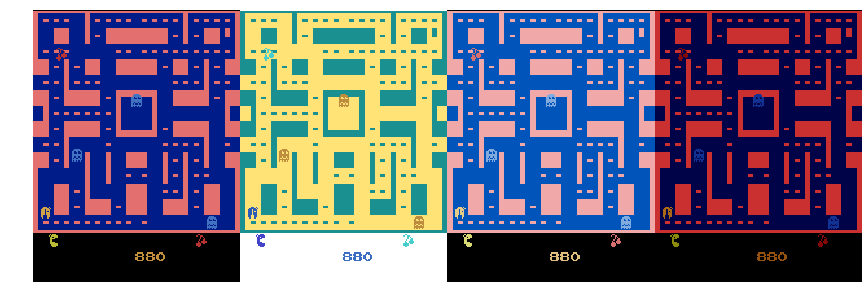

In [6]:
import matplotlib.image as mpimg

data_arr = [data1, data2, data3, data4]
random_idx = np.random.randint(N)
transformed_frames = np.hstack([np.flip(transformed_data[random_idx], axis=-1) for transformed_data in data_arr])

print("Frame {} after transformations 1 (unaltered), 2, 3, and 4 respectively".format(random_idx))

plt.figure(figsize=(20,5))
plt.imshow(transformed_frames)
plt.axis('off')
plt.show()

## Visualize data in three ways

We randomly chose 1000 out of 10000 Ms. Pacman frames acquired by running trained policies. We then applied each of the four visual transformations to the 1000 frames to get 4000 frames. We now visualize this 4000 frame collection through the following methods:

1. Histogram of pixel intensities for each channel (blue, green, red)
2. PCA
3. t-SNE with PCA input

### Histogram of pixel intensities for each channel (blue, green, red)

The color of the bars matches the color that the channel and intensity correspond to. For example, the bar for 255 for the rightmost column has color (0, 0, 255), which is pure red in BGR channel format.

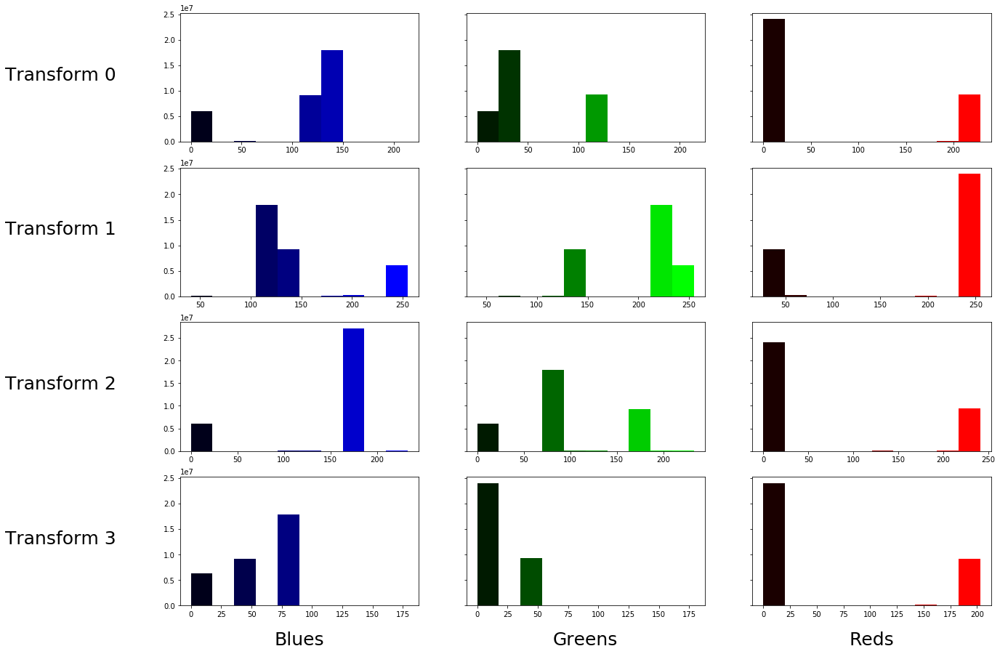

In [7]:
from matplotlib.colors import LinearSegmentedColormap

n_transforms = 4
n_channels = data1.shape[3]
hist_data = [[[None, None] for j in range(n_channels)] for k in range(n_transforms)]

fig, axes = plt.subplots(nrows=4, ncols=3, sharey='row', figsize=(20, 15))

cmaps = ['Blues', 'Greens', 'Reds'] 

colors_red = [(0.1, 0, 0), (1, 0, 0)]
colors_green = [(0, 0.1, 0), (0, 1, 0)]
colors_blue = [(0, 0, 0.1), (0, 0, 1)]
colors = [colors_blue, colors_green, colors_red]
n_bin = 255

for transform_num in range(n_transforms):
    for channel_num in range(n_channels):
        hist_data[transform_num][channel_num] = np.unique(data_arr[transform_num][:, :, :, channel_num], return_counts=True)
        
        cm = LinearSegmentedColormap.from_list('a', colors[channel_num], N=n_bin)
        n, bins, patches = axes[transform_num, channel_num].hist(data_arr[transform_num][:, :, :, channel_num].ravel())
        
        bin_centers = 0.5 * (bins[:-1] + bins[1:])

        # scale values to interval [0,1]
        col = bin_centers - min(bin_centers)
        col /= max(col)
        
        for c, p in zip(col, patches):
            plt.setp(p, 'facecolor', cm(c))
            
        if channel_num == 0:
            axes[transform_num, channel_num].set_ylabel('Transform {}'.format(transform_num), rotation=0, fontsize=25)
            axes[transform_num, channel_num].yaxis.set_label_coords(-0.5, 0.45)
            
        if transform_num == 3:
            axes[transform_num, channel_num].set_xlabel(cmaps[channel_num], fontsize=25)
            axes[transform_num, channel_num].xaxis.set_label_coords(0.5, -0.2)

The different transforms result in distinct intensity counts for both the blue and green channels. The intensities for the red channel are less different, but the PCA plot below shows that frames corresponding to different transformations are still easily separable.

### PCA and t-SNE with PCA input

In [8]:
data_reshaped = data.reshape(data.shape[0], -1)
data1_reshaped, data2_reshaped, data3_reshaped, data4_reshaped = transform_data(data_reshaped)

X = np.vstack([data1_reshaped, data2_reshaped, data3_reshaped, data4_reshaped]).astype('float32') / 255.0

num_transforms = int(X.shape[0] / data_reshaped.shape[0])
assert num_transforms == X.shape[0] / data_reshaped.shape[0], "Error: num_transforms must be integer-valued (i.e. decimal part = 0)" 

transform = np.vstack([np.full((data1_reshaped.shape[0], 1), i) for i in np.linspace(1, num_transforms, num=num_transforms)])
transform = np.squeeze(transform)

print(X.shape, transform.shape)

(4000, 100800) (4000,)


In [9]:
# Load data into dataframe for easier plotting later
feat_cols = ['pixel' + str(i) for i in range(X.shape[1])]

df = pd.DataFrame(X, columns=feat_cols)
df['transform'] = transform
df['label'] = df['transform'].apply(lambda i: str(i))

X, y = None, None

print('Size of the dataframe: {}'.format(df.shape))

Size of the dataframe: (4000, 100802)


In [10]:
# t-SNE with PCA input
np.random.seed(0)
rand_perm_idxes = np.random.permutation(df.shape[0])

df_subset = df.loc[rand_perm_idxes[:(N * num_transforms)], :].copy()
data_subset = df_subset[feat_cols].values

pca_n_comp = 2
pca_n = PCA(n_components=pca_n_comp)
pca_result_n = pca_n.fit_transform(data_subset)

df_subset['pca-one'] = pca_result_n[:, 0]
df_subset['pca-two'] = pca_result_n[:, 1]
# df_subset['pca-three'] = pca_result_n[:, 2] 

print('Cumulative explained variation for {} principal components: {}'.format(pca_n_comp, np.sum(pca_n.explained_variance_ratio_)))

Cumulative explained variation for 2 principal components: 0.9669098258018494


Because the data is easily separable, just two principal components explain 97% of the variance in the data.

In [11]:
time_start = time.time()
tsne = TSNE(n_components=3, verbose=0, perplexity=40, n_iter=1000, learning_rate=200.0, n_jobs=-1)
tsne_pca_results = tsne.fit_transform(pca_result_n)
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

df_subset['tsne-pca{}-one'.format(pca_n_comp)] = tsne_pca_results[:, 0]
df_subset['tsne-pca{}-two'.format(pca_n_comp)] = tsne_pca_results[:, 1]

t-SNE done! Time elapsed: 52.795005321502686 seconds


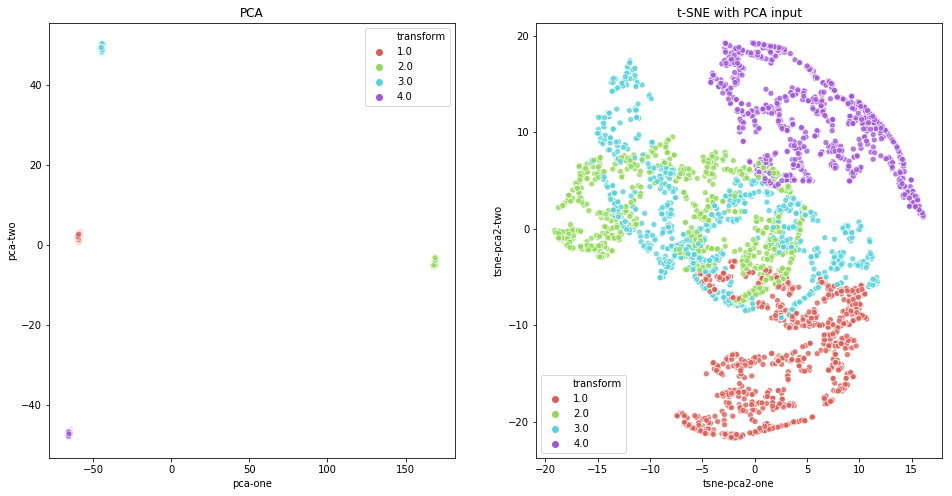

In [12]:
plt.figure(figsize=(16,8))
ax1 = plt.subplot(1, 2, 1)
sns.scatterplot(
    x="pca-one", y="pca-two",
    hue="transform",
    palette=sns.color_palette("hls", num_transforms),
    data=df_subset,
    legend="full",
    alpha=0.8,
    ax=ax1
)
plt.title('PCA')
# plt.legend([1, 2, 3, 4], title='transform', loc='upper right')
ax3 = plt.subplot(1, 2, 2)
sns.scatterplot(
    x='tsne-pca{}-one'.format(pca_n_comp), y='tsne-pca{}-two'.format(pca_n_comp),
    hue="transform",
    palette=sns.color_palette("hls", num_transforms),
    data=df_subset,
    legend="full",
    alpha=0.8,
    ax=ax3
)
plt.title('t-SNE with PCA input')
# plt.legend([1, 2, 3, 4], title='transform', loc='upper right')
plt.show()

### All three data visualization techniques show that frames resulting from different visual transformations are easily separable.

# Part 2: Experiments and Results

Imports and functions for Part 2

In [11]:
import numpy as np
import pandas as pd
import tensorflow as tf
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()

/home/pranay/anaconda2/envs/visual_interference_openai/lib/python3.5/site-packages/tensorflow-1.14.0-py3.5-linux-x86_64.egg/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/pranay/anaconda2/envs/visual_interference_openai/lib/python3.5/site-packages/tensorflow-1.14.0-py3.5-linux-x86_64.egg/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/pranay/anaconda2/envs/visual_interference_openai/lib/python3.5/site-packages/tensorflow-1.14.0-py3.5-linux-x86_64.egg/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecat

In [12]:
# Return average clipped rewards as a list
def parse_tf_events_file_avg_clipped_returns(filename):
    train_returns = []
    for e in tf.train.summary_iterator(filename): # changed from file to filename
        for v in e.summary.value:
            if v.tag == 'Train_AverageReturnClipped':
                train_returns.append(v.simple_value)

    return train_returns

# Return average actual rewards as a list
def parse_tf_events_file_avg_actual_returns(filename):
    train_returns = []
    for e in tf.train.summary_iterator(filename): # changed from file to filename
        for v in e.summary.value:
            if v.tag == 'Train_AverageReturnActual':
                train_returns.append(v.simple_value)

    return train_returns


# Reward type: 'clip' or 'actual'
def plot_no_moving_avg(filenames_a, filenames_b, reward_type, timestep_upper_bound=None, title=None, legend=None):
    
    plt.figure(figsize=(30, 10))
    
    for f_a, f_b in zip(filenames_a, filenames_b):
    
        if reward_type == 'clip':
            y_tag = 'avg_clipped_return'
            avg_return_a = parse_tf_events_file_avg_clipped_returns(f_a)
            avg_return_b = parse_tf_events_file_avg_clipped_returns(f_b)
        elif reward_type == 'actual':
            y_tag = 'avg_actual_return'
            avg_return_a = parse_tf_events_file_avg_actual_returns(f_a)
            avg_return_b = parse_tf_events_file_avg_actual_returns(f_b)
            plt.ylim(0, 2000)
        else: 
            print('Error: invalid reward_type')
        
        if timestep_upper_bound is None:
            timestep_upper_bound = min(len(avg_return_a), len(avg_return_b), 500)

        timestep = np.arange(timestep_upper_bound) * 5000

        df_a = pd.DataFrame()
        df_a['timestep'] = timestep
        df_a[y_tag] = avg_return_a[:timestep_upper_bound]

        df_b = pd.DataFrame()
        df_b['timestep'] = timestep
        df_b[y_tag] = avg_return_b[:timestep_upper_bound]

        result = df_a.append(df_b)

        ax = sns.lineplot(x='timestep', y=y_tag, data=result, ci='sd')
        if title is not None:
            ax.set_title(title, fontdict={'fontsize':30})
        if legend is not None:
            ax.legend(legend, loc='upper left', fontsize=18)
        ax.set_xlabel('timestep', fontdict={'fontsize':20})
        ax.set_ylabel(y_tag, fontdict={'fontsize':20})
        
# Reward type: 'clip' or 'actual'
def plot_moving_avg(all_transform_filenames_1, all_transform_filenames_2_a, all_transform_filenames_2_b, reward_type, n_to_avg=10, timestep_upper_bound=None, title=None, legends=None):
    
    for transform_filenames_1, transform_filenames_2_a, transform_filenames_2_b, legend in zip(all_transform_filenames_1, all_transform_filenames_2_a, all_transform_filenames_2_b, legends):
    
        plt.figure(figsize=(30, 10))
    
        for f_1, f_2_a, f_2_b in zip(transform_filenames_1, transform_filenames_2_a, transform_filenames_2_b):

            if reward_type == 'clip':
                avg_return_1 = parse_tf_events_file_avg_clipped_returns(f_1)
                avg_return_2 = parse_tf_events_file_avg_clipped_returns(f_2_a) + parse_tf_events_file_avg_clipped_returns(f_2_b)    
                y_tag = 'avg_clipped_return_moving_avg_{}'.format(n_to_avg)

            elif reward_type == 'actual':
                avg_return_1 = parse_tf_events_file_avg_actual_returns(f_1)
                avg_return_2 = parse_tf_events_file_avg_actual_returns(f_2_a) + parse_tf_events_file_avg_actual_returns(f_2_b)    
                y_tag = 'avg_actual_return_moving_avg_{}'.format(n_to_avg)

            else:
                print('Error: invalid reward_type')

            avg_return_moving_avg_1 = []
            avg_return_moving_avg_2 = []
            timestep_upper_bound = min(len(avg_return_1), len(avg_return_2))
            for i in range(timestep_upper_bound):
                avg_return_moving_avg_1.append(np.mean(avg_return_1[(i - 10):i]))
                avg_return_moving_avg_2.append(np.mean(avg_return_2[(i - 10):i]))

            timestep = np.arange(timestep_upper_bound) * 5000

            df_1 = pd.DataFrame()
            df_1['timestep'] = timestep
            df_1[y_tag] = avg_return_moving_avg_1

            df_2 = pd.DataFrame()
            df_2['timestep'] = timestep
            df_2[y_tag] = avg_return_moving_avg_2

            result = df_1.append(df_2)

            ax = sns.lineplot(x='timestep', y=y_tag, data=result, ci='sd')
        
        if title is not None:
            ax.set_title(title, fontdict={'fontsize':30})
        if legend is not None:
            ax.legend(legend, loc='upper left', fontsize=18)
        ax.set_xlabel('timestep', fontdict={'fontsize':20})
        ax.set_ylabel(y_tag, fontdict={'fontsize':20})

Data for Part 2 - 2 indiv, 1 multi

In [13]:
# Fully random sampling
# Transforms 1 and 2
# Seed = 0
filenames_1a = ["data/30-12-2019_05-58-10/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685506.winter-19-gpu-works-vm",
              "data/30-12-2019_05-58-10/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685508.winter-19-gpu-works-vm",
              "data/30-12-2019_05-58-10/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685509.winter-19-gpu-works-vm",
              "data/30-12-2019_05-58-10/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685509.winter-19-gpu-works-vm"]

# Seed = 1
filenames_1b = ["data/30-12-2019_05-58-14/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685514.winter-19-gpu-works-vm",
              "data/30-12-2019_05-58-14/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685514.winter-19-gpu-works-vm",
              "data/30-12-2019_05-58-14/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685514.winter-19-gpu-works-vm",
              "data/30-12-2019_05-58-14/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685514.winter-19-gpu-works-vm"]

# Transforms 1 and 3
# Seed = 0
filenames_2a = ["data/30-12-2019_05-56-54/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685428.winter-19-gpu-works-vm",
              "data/30-12-2019_05-56-54/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685428.winter-19-gpu-works-vm",
              "data/30-12-2019_05-56-54/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685431.winter-19-gpu-works-vm",
              "data/30-12-2019_05-56-54/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685431.winter-19-gpu-works-vm"]

# Seed = 1
filenames_2b = ["data/30-12-2019_05-56-58/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685436.winter-19-gpu-works-vm",
              "data/30-12-2019_05-56-58/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685436.winter-19-gpu-works-vm",
              "data/30-12-2019_05-56-58/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685436.winter-19-gpu-works-vm",
              "data/30-12-2019_05-56-58/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577685436.winter-19-gpu-works-vm"]

# Sample batch_size samples per buffer from randomly ordered buffers
# Transforms 1 and 2
# Seed = 0
filenames_3a = ["data/01-01-2020_03-23-50/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849049.winter-19-gpu-works-vm",
              "data/01-01-2020_03-23-50/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849049.winter-19-gpu-works-vm",
              "data/01-01-2020_03-23-50/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849048.winter-19-gpu-works-vm",
              "data/01-01-2020_03-23-50/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849048.winter-19-gpu-works-vm"]

# Seed = 1
filenames_3b = ["data/01-01-2020_03-23-58/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849051.winter-19-gpu-works-vm",
              "data/01-01-2020_03-23-58/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849052.winter-19-gpu-works-vm",
              "data/01-01-2020_03-23-58/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849052.winter-19-gpu-works-vm",
              "data/01-01-2020_03-23-58/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849052.winter-19-gpu-works-vm"]

# Transforms 1 and 3
# Seed = 0
filenames_4a = ["data/01-01-2020_03-35-34/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849750.winter-19-gpu-works-vm",
              "data/01-01-2020_03-35-34/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849752.winter-19-gpu-works-vm",
              "data/01-01-2020_03-35-34/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849752.winter-19-gpu-works-vm",
              "data/01-01-2020_03-35-34/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849752.winter-19-gpu-works-vm"]

# Seed = 1
filenames_4b = ["data/01-01-2020_03-35-55/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849775.winter-19-gpu-works-vm",
              "data/01-01-2020_03-35-55/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849777.winter-19-gpu-works-vm",
              "data/01-01-2020_03-35-55/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849777.winter-19-gpu-works-vm",
              "data/01-01-2020_03-35-55/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577849777.winter-19-gpu-works-vm"]

Data for Part 2 - 4 indiv, 4 multi

In [14]:
# Data for run 1 (seed = 0)
transform_1_filenames_1 = ["data/02-01-2020_07-47-56/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951283.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951327.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_1/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951342.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_2/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951357.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_3/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951372.rl-1-vm"]

transform_2_filenames_1 = ["data/02-01-2020_07-47-56/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951294.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951327.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_1/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951342.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_2/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951357.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_3/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951372.rl-1-vm"]

transform_3_filenames_1 = ["data/02-01-2020_07-47-56/DQN_indiv_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951306.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_0/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951327.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_1/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951342.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_2/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951357.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_3/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951372.rl-1-vm"]

transform_4_filenames_1 = ["data/02-01-2020_07-47-56/DQN_indiv_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951319.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_0/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951327.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_1/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951342.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_2/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951357.rl-1-vm",
                           "data/02-01-2020_07-47-56/DQN_multi_3/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577951372.rl-1-vm"]

# Data for run 2 (seed = 3). There are two parts, a and b, because training stalled and was resumed later.
transform_1_filenames_2_a = ["data/01-01-2020_07-01-14/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862081.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862127.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_1/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862142.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_2/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862155.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_3/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862173.rl-1-vm"]

transform_2_filenames_2_a = ["data/01-01-2020_07-01-14/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862090.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862127.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_1/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862142.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_2/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862155.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_3/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862173.rl-1-vm"]

transform_3_filenames_2_a = ["data/01-01-2020_07-01-14/DQN_indiv_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862102.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_0/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862127.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_1/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862142.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_2/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862155.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_3/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862173.rl-1-vm"]

transform_4_filenames_2_a = ["data/01-01-2020_07-01-14/DQN_indiv_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862118.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_0/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862127.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_1/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862142.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_2/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862155.rl-1-vm",
                             "data/01-01-2020_07-01-14/DQN_multi_3/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1577862173.rl-1-vm"]

transform_1_filenames_2_b = ["data/03-01-2020_20-54-56/DQN_indiv_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084911.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084943.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_1/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084958.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_2/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084974.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_3/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084989.rl-1-vm"]

transform_2_filenames_2_b = ["data/03-01-2020_20-54-56/DQN_indiv_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084912.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_0/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084943.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_1/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084958.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_2/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084974.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_3/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084989.rl-1-vm"]

transform_3_filenames_2_b = ["data/03-01-2020_20-54-56/DQN_indiv_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084922.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_0/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084943.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_1/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084958.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_2/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084974.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_3/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084989.rl-1-vm"]

transform_4_filenames_2_b = ["data/03-01-2020_20-54-56/DQN_indiv_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084933.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_0/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084943.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_1/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084958.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_2/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084974.rl-1-vm",
                             "data/03-01-2020_20-54-56/DQN_multi_3/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1578084989.rl-1-vm"]

# Experiments

We primarily use the DQN architecture from the Nature 2015 paper. In the 4 indiv, 4 multi trials, we investigate how changes to multi-task network architecture affects multi-task learning. We pull from past experience and use hyperparameters that result in consistent learning behavior on Ms. Pacman. 

These hyperparameters are:
* discount factor = 0.99
* learning rate = 1e-4
* linear schedule exploration: annealing from 1.0 to 0.01 over the first 500,000 timesteps
* indiv task batch size = 16
* multi task batch size = (# indiv tasks) * (indiv task batch size)
* learning starts at 25,000 samples
* replay buffer size = 50,000
* double DQN
* target net update freq = 5000 

Two sample methods are used: 
1. Sample method 1: Multi-task DQNs sample a random number of samples from each replay buffer, with the constraint that the total number of samples equals (indiv task batch size) * (# of indiv tasks). The full set of samples is permuted before multi-task DQNs train on it.
2. Sample method 2: Multi-task DQNs sample indiv_task_batch_size samples from each individual task replay buffer, and only the replay buffer order is randomized. 

### 2 indiv, 1 multi
We evaluate four experiments here:

Using sample method 1,
1. Train two individual DQNs, one on transformation 1 (unaltered), and one on transformation 2 (negative). Simultaneously train a single multi-task DQN to perform both of these tasks. 
2. Train two individual DQNs, one on transformation 1 (unaltered), and one on transformation 3. Simultaneously train a single multi-task DQN to perform both of these tasks.

Using sample method 2,
3. Do experiment 1 above
4. Do experiment 2 above

### 4 indiv, 4 multi
We train four individual DQNs, one for each transformation 1, 2, 3, and 4, and simultaneously train four multi-task DQNS to perform all these tasks. To gain insight into how network architecture affects multi-task learning, each multi-task DQN has a different architecture as follows:

1. Original DQN architecture. This is depicted directly below

![](nb_figs/dqn_architecture.gif)

2. Original DQN architecture with hidden/conv layer 3 removed.
3. Original DQN architecture with additional hidden/conv layer that has 64 output filters, kernel size=(1,1), strides=(1,1), and valid padding added between hidden/conv layer 3 and hidden/fc layer 4.
4. Original DQN architecture with hidden/conv layer 3 that has double the output filters as the original (128 vs 64).

Here we use only sample method 2.


### All results are averaged over two seeds, and the shaded regions in the following plots represent the standard deviation errors over these seeds. Plots for both clipped and actual rewards are provided. Since rewards are clipped to [-1, +1], clipped and actual rewards strongly correlate with one another. However, clipped rewards have less variance, so the plots representing them may be easier to interpret.

# Results

## 2 indiv, 2 multi

In [15]:
timestep_upper_bound = 230 # manually set to shortest timestep of the following 8 files, which is 230 for 4a and 4b
titles = ['Transforms 1 and 2. Sample method 1.', 'Transforms 1 and 3. Sample method 1.', 'Transforms 1 and 2. Sample method 2.', 'Transforms 1 and 3. Sample method 2.']
legends = [['indiv task 1 on transform 1', 'indiv task 2 on transform 2', 'multi task 1 on transform 1', 'multi task 1 on transform 2'],
           ['indiv task 1 on transform 1', 'indiv task 2 on transform 3', 'multi task 1 on transform 1', 'multi task 1 on transform 3'],
           ['indiv task 1 on transform 1', 'indiv task 2 on transform 2', 'multi task 1 on transform 1', 'multi task 1 on transform 2'],
           ['indiv task 1 on transform 1', 'indiv task 2 on transform 2', 'multi task 1 on transform 1', 'multi task 1 on transform 3']]
all_filenames_a = [filenames_1a, filenames_2a, filenames_3a, filenames_4a]
all_filenames_b = [filenames_1b, filenames_2b, filenames_3b, filenames_4b]

#### Clipped rewards

Instructions for updating:
Use eager execution and: 
`tf.data.TFRecordDataset(path)`


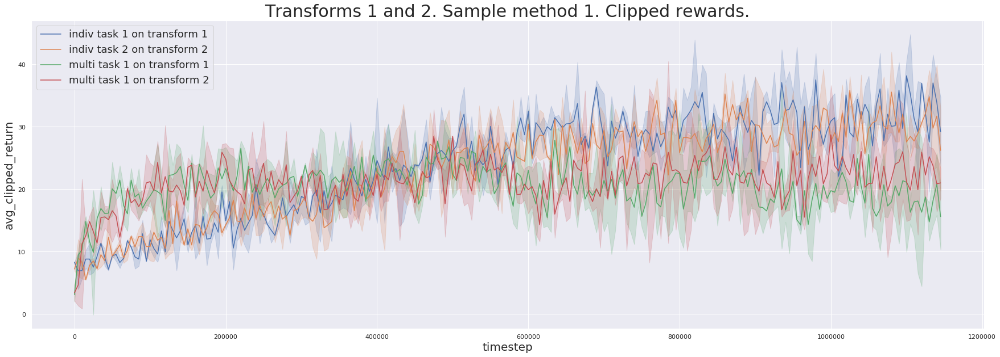

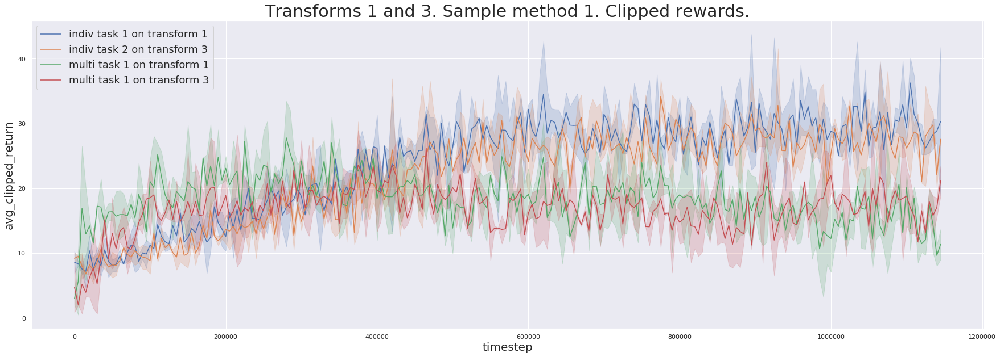

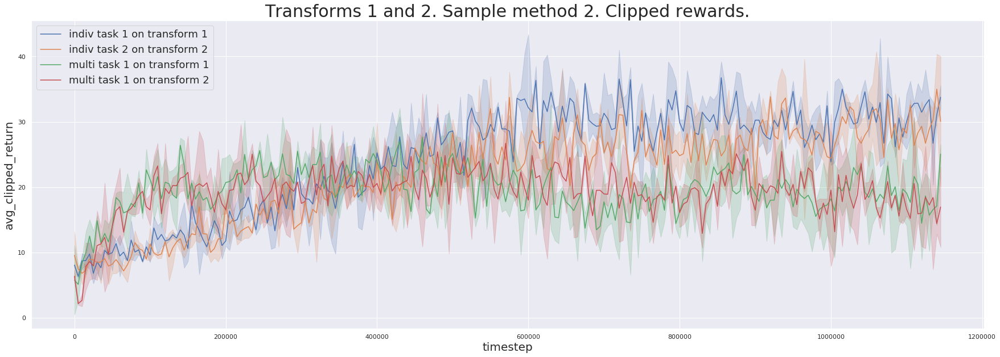

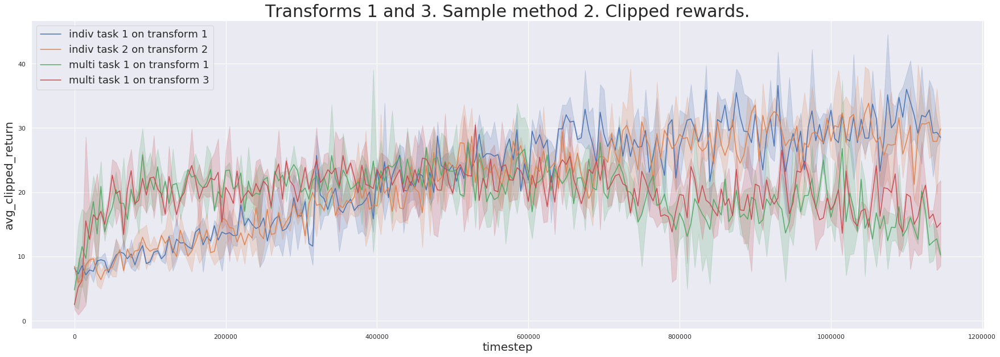

In [16]:
for title, legend, filenames_a, filenames_b in zip(titles, legends, all_filenames_a, all_filenames_b):
    plot_no_moving_avg(filenames_a, filenames_b, reward_type='clip', timestep_upper_bound=timestep_upper_bound, title=title + ' Clipped rewards.', legend=legend)

#### Actual rewards

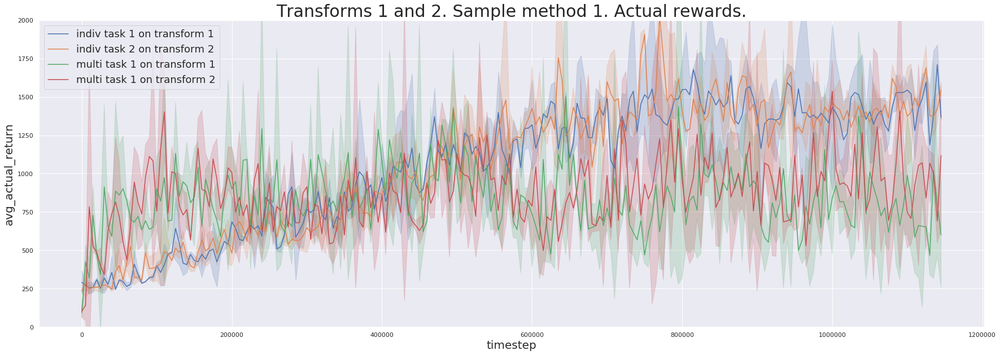

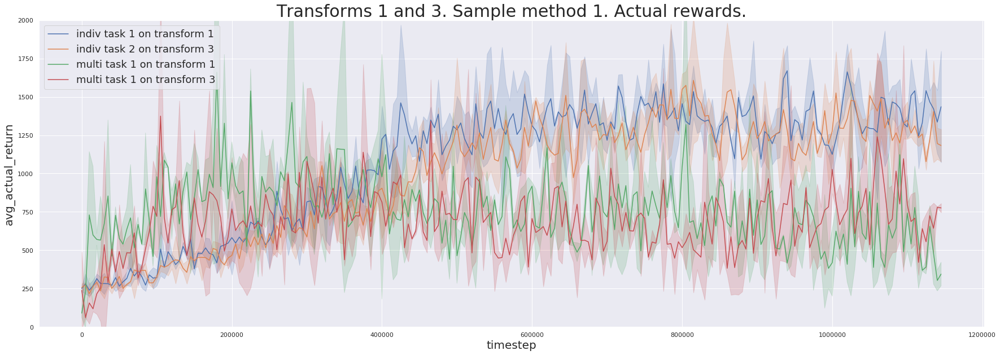

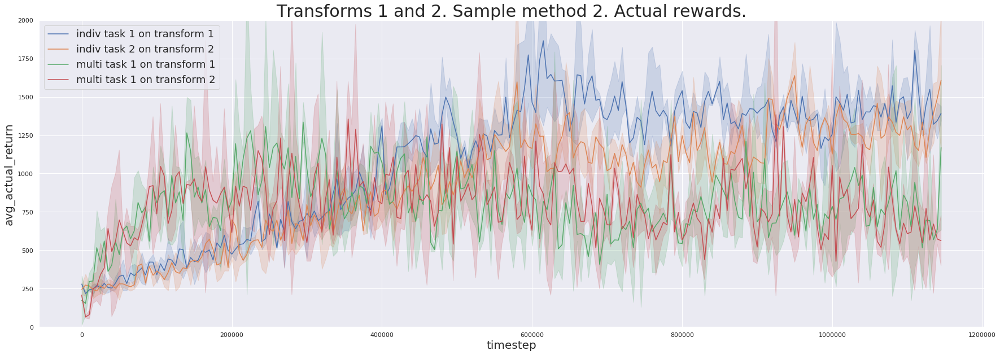

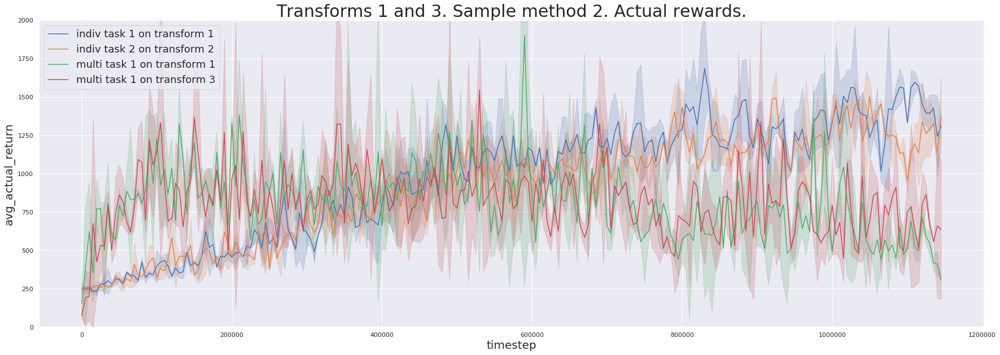

In [17]:
for title, legend, filenames_a, filenames_b in zip(titles, legends, all_filenames_a, all_filenames_b):
    plot_no_moving_avg(filenames_a, filenames_b, reward_type='actual', timestep_upper_bound=timestep_upper_bound, title=title + ' Actual rewards.', legend=legend)

### Continuing trends

We cut off the graphs at 1,150,000 timesteps because that's the length of the shortest run and a uniform timestep count allows us to quickly compare the performances of different runs.

However, for every run, the trends above continue for the entire run. Here are graphs from experiment 3 for ~2,200,000 timesteps.

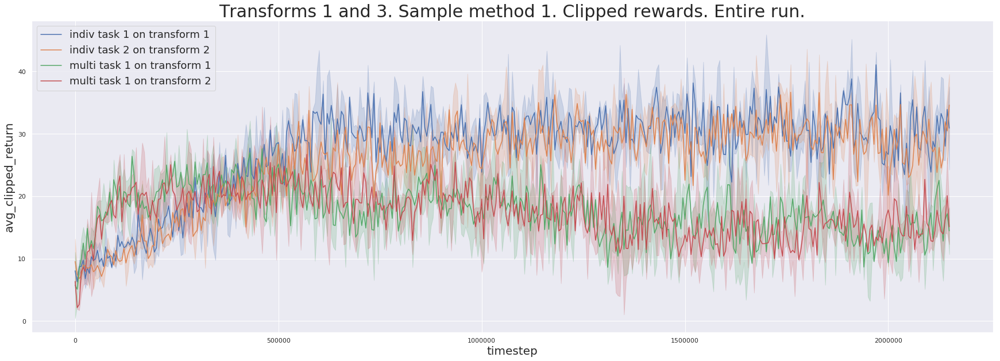

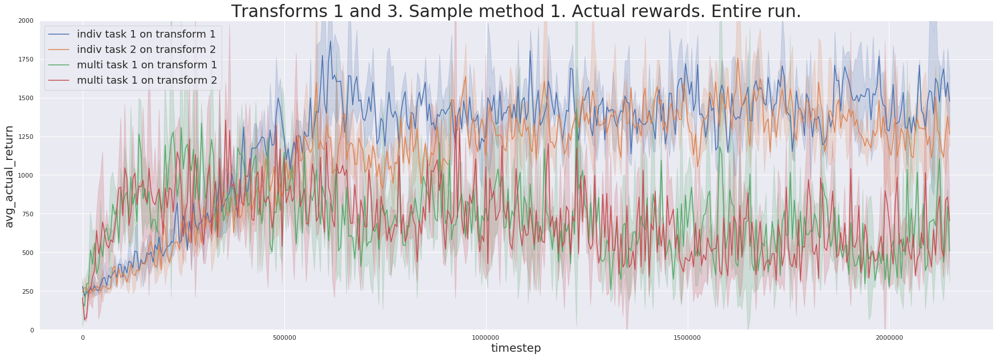

In [18]:
plot_no_moving_avg(filenames_3a, filenames_3b, reward_type='clip', timestep_upper_bound=None, title='Transforms 1 and 3. Sample method 1. Clipped rewards. Entire run.', legend=legends[2])
plot_no_moving_avg(filenames_3a, filenames_3b, reward_type='actual', timestep_upper_bound=None, title='Transforms 1 and 3. Sample method 1. Actual rewards. Entire run.', legend=legends[2])

## 4 indiv, 4 multi

### Transforms 1, 2, 3, and 4. 

Recall that the multi-task agents differ in architecture as described in Experiments - 4 indiv, 4 multi and that only sample method 2 is used for 4 indiv, 4 multi runs.

To more easily interpret the results, we show the moving averages of the 10 most recently averaged returns below.

In [19]:
all_transform_filenames_1 = [transform_1_filenames_1, transform_2_filenames_1, transform_3_filenames_1, transform_4_filenames_1]
all_transform_filenames_2_a = [transform_1_filenames_2_a, transform_2_filenames_2_a, transform_3_filenames_2_a, transform_4_filenames_2_a]
all_transform_filenames_2_b = [transform_1_filenames_2_b, transform_2_filenames_2_b, transform_3_filenames_2_b, transform_4_filenames_2_b]
title = 'Transforms 1, 2, 3, and 4. Sample method 2.'
legends = [['indiv task 1 on transform 1', 'multi task 1 on transform 1', 'multi task 2 on transform 1', 'multi task 3 on transform 1', 'multi task 4 on transform 1'],
           ['indiv task 2 on transform 2', 'multi task 1 on transform 2', 'multi task 2 on transform 2', 'multi task 3 on transform 2', 'multi task 4 on transform 2'],
           ['indiv task 3 on transform 3', 'multi task 1 on transform 3', 'multi task 2 on transform 3', 'multi task 3 on transform 3', 'multi task 4 on transform 3'],
           ['indiv task 4 on transform 4', 'multi task 1 on transform 4', 'multi task 2 on transform 4', 'multi task 3 on transform 4', 'multi task 4 on transform 4']]

#### Clipped rewards

/home/pranay/.local/lib/python3.5/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/pranay/.local/lib/python3.5/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


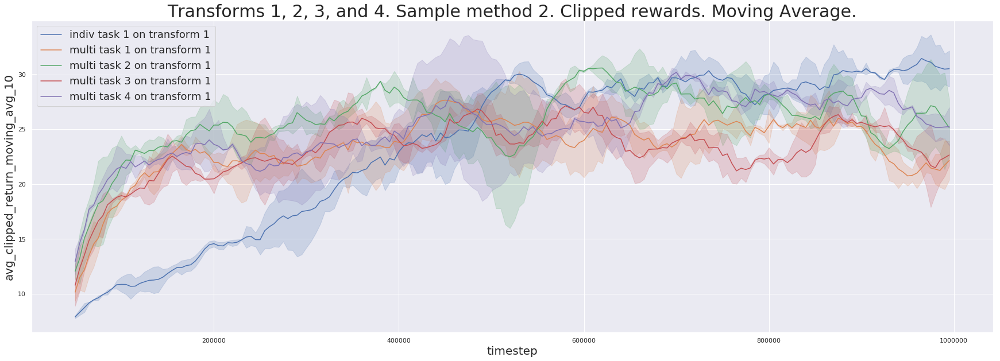

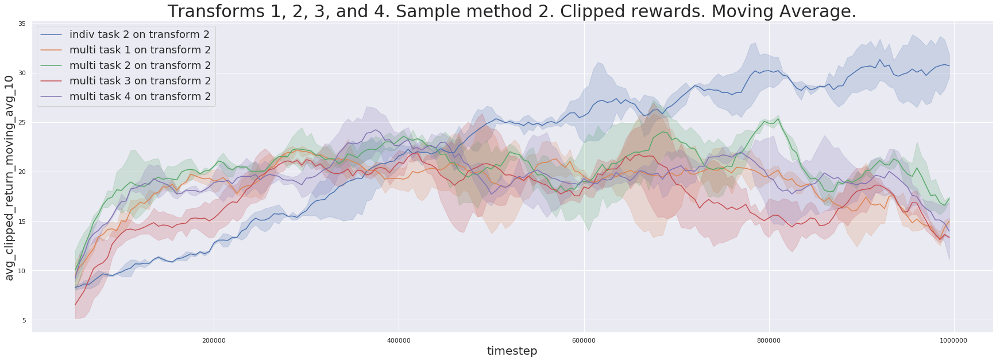

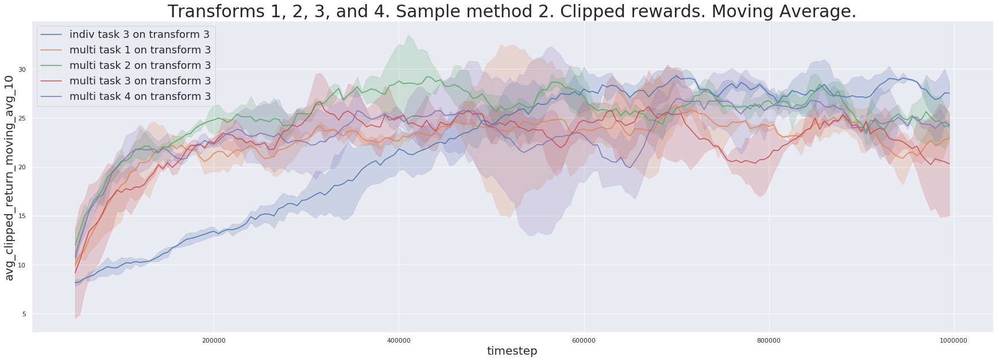

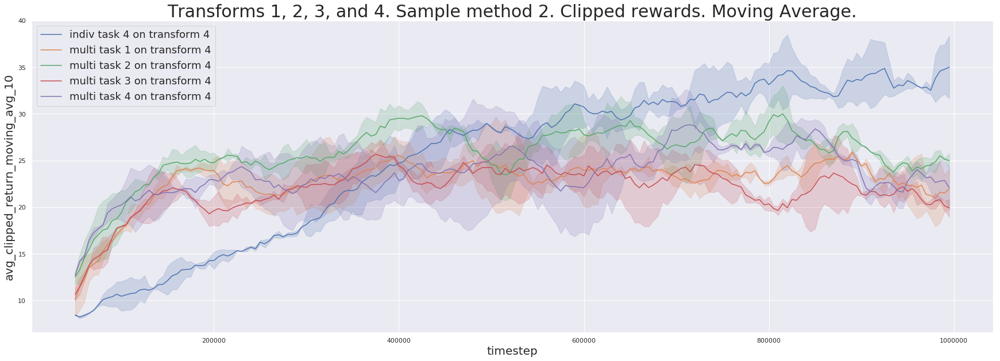

In [20]:
plot_moving_avg(all_transform_filenames_1, all_transform_filenames_2_a, all_transform_filenames_2_b, reward_type='clip', n_to_avg=10, title=title + ' Clipped rewards. Moving Average.', legends=legends)

#### Actual rewards

/home/pranay/.local/lib/python3.5/site-packages/numpy/core/fromnumeric.py:3257: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
/home/pranay/.local/lib/python3.5/site-packages/numpy/core/_methods.py:161: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


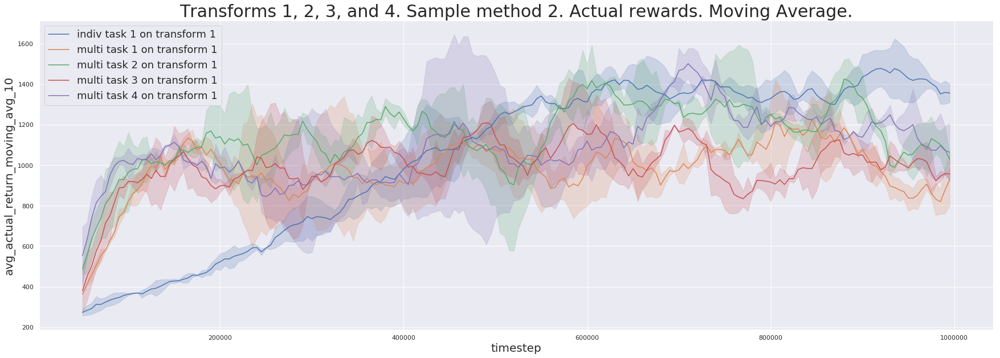

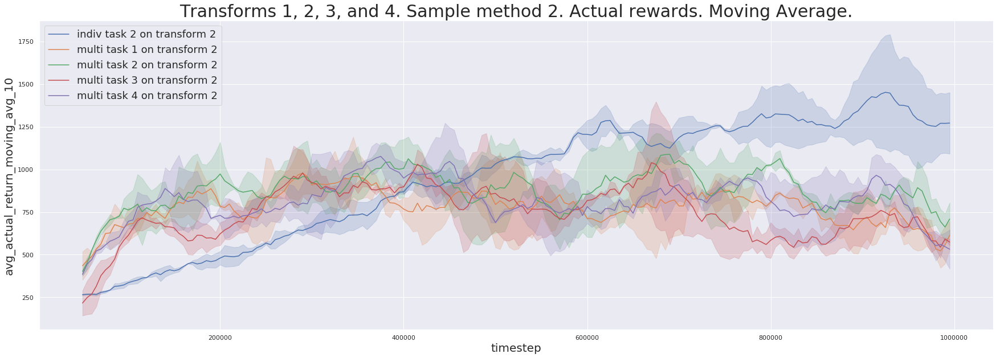

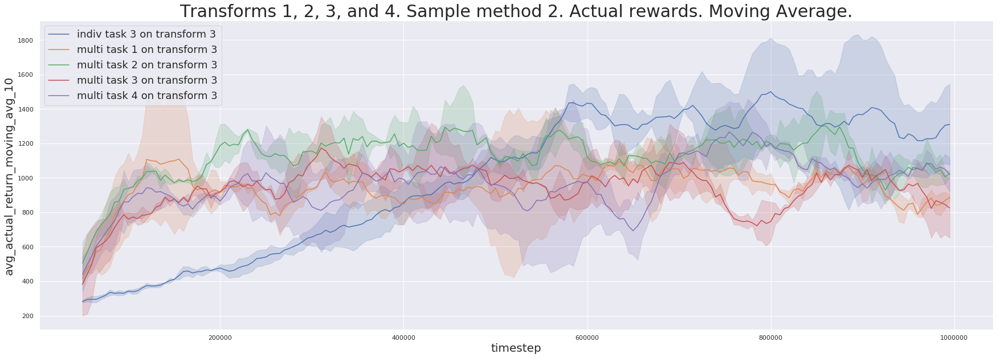

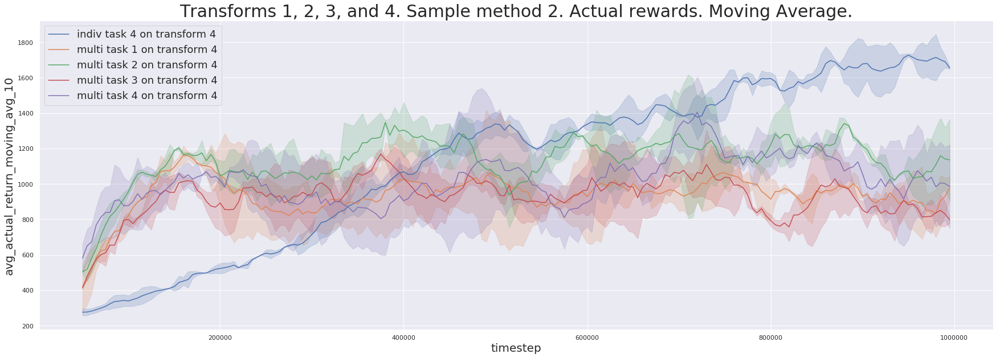

In [21]:
plot_moving_avg(all_transform_filenames_1, all_transform_filenames_2_a, all_transform_filenames_2_b, reward_type='actual', n_to_avg=10, title=title + ' Actual rewards. Moving Average.', legends=legends)

### Takeaways
* No multi-task policy performed even one task as well as the corresponding individual-task policy did even though the multi-task policies trained on 64 samples per step, 16 from each task, and the individual task policies trained on only 16 samples per step.
* Multi-task policies 2 and 4 consistently did better than 1 and 3. In fact, 2 almost always did the best out of all of the policies, individual and multi-task. The architecture of 2 is the DQN Nature 2015 architecture with the 3rd conv/hidden layer removed, so 2 is the least complex model used in this work. This suggests that simpler models may learn better during early phases of training and may be used to improve sample and wall-clock efficiencies. This also suggests that more complex models overfit early into the training process We believe this is likely because models see only little data early on, so they are prone to overfitting to this data.
* Multi-task policies 3 and 4 have greater model capacity than 1 and 2 but generally do not perform better than 1 or 2. This indicates that blindly increasing model complexity in RL may not help capture data diversity as much as it does in supervised learning.

# Part 3: Key Takeaways

* Visual dissimilarities across source tasks can significantly inhibit multi-task learning. In fact, the resulting multi-task policy may not be able to perform any of the source tasks as well as individual task policies do. In this work, no multi-task policies performed even one task as well as the corresponding individual-task policy did even though the sets of task observations between tasks were easily separable and the multi-task policies trained on 2 to 4 times the data that the individual task policies did.
* In this work, greater visual dissimilarities across source tasks resulted in worse performance. Concretely, multi-task policies in the 2 indiv, 1 multi experiement performed worse when trained on Transforms 1 and 2 than when trained on Transforms 1 and 3.
* The least complex multi-task policy performed the best out of the multi-task policies on the 4 indiv, 4 multi runs. This indicates that complex policies are prone to overfitting early into training and that using simpler policies in this regime may improve sample and time efficiencies.

## References

Mnih, Volodymyr, Kavukcuoglu, Koray, Silver, David, Rusu, Andrei A, Veness, Joel, Bellemare, Marc G, Graves, Alex, Riedmiller, Martin, Fidjeland, Andreas K, Ostrovski, Georg, Petersen, Stig, Beattie, Charles, Sadik, Amir, Antonoglou, Ioannis, King, Helen, Kumaran, Dharshan, Wierstra, Daan, Legg, Shane, and Hassabis, Demis. Human-level control through deep reinforcement learning. Nature, 518(7540):529–533, 2015.

# Appendix

## Multithreading Performance

Here we show the wall-clock efficiency improvement of the multithreading approach used in this work over a vanilla sequential implementation. Trials were done using one Tesla K80 per pair of individual task and multi-task DQNs.

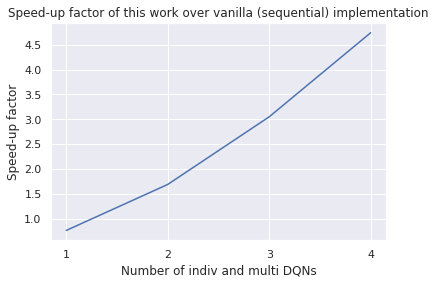

In [22]:
import matplotlib
matplotlib.use('TkAgg')

import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()


def parse_tf_events_file_time(filename):
    times_since_start = []
    for e in tf.train.summary_iterator(filename): # changed from file to filename
        for v in e.summary.value:
            if v.tag == 'TimeSinceStart':
                times_since_start.append(v.simple_value)

    return times_since_start

if __name__=='__main__':

    filenames = ['data/06-01-2020_03-57-05/DQN_multi_0/indiv_task_0_MsPacmanNoFrameskip-v4/events.out.tfevents.1578283058.rl-1-vm',
                 'data/05-01-2020_00-42-58/DQN_multi_1/indiv_task_1_MsPacmanNoFrameskip-v4/events.out.tfevents.1578185022.rl-1-vm',
                 'data/05-01-2020_03-58-49/DQN_multi_2/indiv_task_2_MsPacmanNoFrameskip-v4/events.out.tfevents.1578196782.rl-1-vm',
                 'data/05-01-2020_04-15-34/DQN_multi_3/indiv_task_3_MsPacmanNoFrameskip-v4/events.out.tfevents.1578197776.rl-1-vm']

    parallel_times = []
    for filename in filenames:

        times_since_start = parse_tf_events_file_time(filename)

        times_to_avg = []
        for i in range(len(times_since_start) - 1):
            times_to_avg.append(times_since_start[i + 1] - times_since_start[i])
        
        parallel_times.append(np.mean(times_to_avg))

    num_agent_pairs = [1, 2, 3, 4]
    num_policy_evals = [1, 4, 9, 16]
    policy_eval_time = 31
    
    seq_times = []
    for batch_multiplier, (i, j) in enumerate(zip(num_agent_pairs, num_policy_evals)):
        seq_times.append(i * (parallel_times[0] - policy_eval_time) + j * policy_eval_time * batch_multiplier)

    speed_up_factors = []
    for i, j in zip(seq_times, parallel_times):
        speed_up_factors.append(i / j)

    sns.lineplot(x=[1, 2, 3, 4], y=speed_up_factors)
    plt.xticks([1, 2, 3, 4])
    plt.title('Speed-up factor of this work over vanilla (sequential) implementation')
    plt.xlabel('Number of indiv and multi DQNs')
    plt.ylabel('Speed-up factor')
    plt.show()

Our parallel implementation attains a 4.7x speed-up over a sequential implementation for the 4 indiv, 4 multi runs.